<a href="https://colab.research.google.com/github/BenFarz/Demo/blob/main/train200-valid100.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')
import os
from skimage import io
import numpy as np
from matplotlib import pyplot as plt
!pip install ultralytics
from ultralytics import YOLO
from matplotlib import pyplot as plt
from PIL import Image

import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls /content/drive/MyDrive/AI1/
print(os.getcwd())


Mounted at /content/drive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 15.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nv

In [2]:
train_path = '/content/drive/MyDrive/AI2/train'
valid_path = '/content/drive/MyDrive/AI2/valid'
yaml_path = '/content/drive/MyDrive/AI2/data.yaml'

In [3]:
model = YOLO('yolov8n-seg.yaml')  # build a new model from YAML
model = YOLO('yolov8n-seg.pt')  # Transfer the weights from a pretrained model (recommended for training)
import yaml

# Load and print the content of the YAML file
with open("/content/drive/MyDrive/AI1/data.yaml", 'r') as stream:
    data = yaml.safe_load(stream)
    print(data)
#Define a project --> Destination directory for all results
project = "/content/drive/MyDrive/AI1/results"
#Define subdirectory for this specific training
name = "200_epochs-" #note that if you run the training again, it creates a directory: 200_epochs-2
# Train the model


100%|██████████| 6.73M/6.73M [00:00<00:00, 228MB/s]


{'train': '/content/drive/MyDrive/AI1/train', 'val': '/content/drive/MyDrive/AI1/valid', 'nc': 1, 'names': ['pothole']}


In [4]:
results = model.train(data='/content/drive/MyDrive/AI2/data.yaml',
                      project=project,
                      name=name,
                      epochs=200,
                      patience=0, #I am setting patience=0 to disable early stopping.
                      batch=4,
                      imgsz=640)

Ultralytics YOLOv8.2.27 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/drive/MyDrive/AI2/data.yaml, epochs=200, time=None, patience=0, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/AI1/results, name=200_epochs-4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_c

100%|██████████| 755k/755k [00:00<00:00, 114MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 270MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/AI2/train/labels... 477 images, 0 backgrounds, 0 corrupt: 100%|██████████| 477/477 [09:09<00:00,  1.15s/it]


train: New cache created: /content/drive/MyDrive/AI2/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/AI2/valid/labels... 234 images, 0 backgrounds, 0 corrupt: 100%|██████████| 234/234 [04:04<00:00,  1.04s/it]

val: New cache created: /content/drive/MyDrive/AI2/valid/labels.cache


Plotting labels to /content/drive/MyDrive/AI1/results/200_epochs-4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/AI1/results/200_epochs-4
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/120 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
      1/200      0.95G      1.524      2.995      2.409      1.478         16        640: 100%|██████████| 120/120 [00:30<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.96it/s]

                   all        234        609      0.479      0.278      0.281      0.122      0.498      0.273      0.285      0.124



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/200         1G      1.565      2.663      2.049       1.54          2        640: 100%|██████████| 120/120 [00:24<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.66it/s]

                   all        234        609      0.415      0.386      0.329      0.143      0.403       0.36      0.307      0.133



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/200     0.898G      1.569      2.659      1.987      1.559          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.53it/s]


                   all        234        609      0.527       0.45      0.452      0.199      0.523      0.438      0.438      0.198

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/200      0.96G      1.625      2.703      1.933      1.595          6        640: 100%|██████████| 120/120 [00:24<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.04it/s]

                   all        234        609      0.575      0.468      0.489      0.233       0.55      0.486      0.484      0.225



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/200      1.02G      1.592      2.662       1.82      1.569         21        640: 100%|██████████| 120/120 [00:22<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.46it/s]


                   all        234        609      0.588       0.56      0.564      0.268      0.586      0.569      0.557      0.273

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/200     0.933G      1.546      2.595      1.792      1.544          3        640: 100%|██████████| 120/120 [00:25<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.64it/s]


                   all        234        609      0.584      0.475        0.5      0.232      0.596      0.461      0.502      0.235

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/200     0.906G      1.518      2.468      1.672      1.504          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.97it/s]


                   all        234        609      0.589      0.527       0.56      0.285      0.547      0.557      0.548      0.268

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/200     0.923G      1.507      2.455      1.585      1.502          4        640: 100%|██████████| 120/120 [00:25<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.95it/s]

                   all        234        609      0.646      0.519      0.555      0.276       0.64      0.532       0.55      0.268



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/200     0.904G      1.498      2.484      1.631       1.49          6        640: 100%|██████████| 120/120 [00:22<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.19it/s]


                   all        234        609      0.644      0.521      0.584      0.306       0.65      0.519       0.58      0.293

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/200     0.921G      1.515      2.419      1.569      1.475          5        640: 100%|██████████| 120/120 [00:25<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.54it/s]

                   all        234        609      0.577      0.542      0.585      0.297      0.575      0.527      0.576      0.291



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/200     0.923G      1.441      2.343      1.519      1.451          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.65it/s]


                   all        234        609      0.619      0.539      0.573      0.295      0.615       0.54      0.574      0.276

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/200      1.03G      1.446      2.405      1.531      1.445          3        640: 100%|██████████| 120/120 [00:24<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.45it/s]

                   all        234        609      0.636      0.589      0.607      0.333      0.633      0.583      0.601      0.324



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/200     0.935G      1.359       2.26      1.393      1.406         12        640: 100%|██████████| 120/120 [00:23<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.43it/s]


                   all        234        609      0.631      0.529      0.598      0.316      0.663      0.504      0.605      0.312

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/200     0.988G      1.377      2.253       1.38      1.402          6        640: 100%|██████████| 120/120 [00:23<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.55it/s]

                   all        234        609      0.656      0.591      0.639      0.344      0.678      0.599      0.646      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/200     0.927G      1.374      2.218      1.353      1.393          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.73it/s]

                   all        234        609      0.604      0.534      0.565      0.296      0.597      0.512      0.542      0.286



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/200      1.03G       1.34       2.23      1.346      1.372          7        640: 100%|██████████| 120/120 [00:23<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.58it/s]

                   all        234        609      0.651      0.555      0.609       0.32       0.63      0.553       0.59        0.3



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/200     0.929G      1.357      2.233      1.368      1.391          1        640: 100%|██████████| 120/120 [00:24<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.87it/s]

                   all        234        609      0.646      0.595      0.595      0.307      0.644      0.594      0.588      0.284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/200      1.03G      1.334      2.218      1.337      1.361          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.62it/s]

                   all        234        609      0.696      0.537       0.61      0.334      0.673      0.555      0.614      0.325



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/200     0.919G      1.325      2.231      1.352      1.349          5        640: 100%|██████████| 120/120 [00:24<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.51it/s]

                   all        234        609      0.644      0.567      0.614      0.329      0.647      0.583      0.613      0.317



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/200     0.929G      1.327      2.171       1.26      1.361          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.45it/s]


                   all        234        609       0.63      0.629      0.671      0.366      0.625      0.624      0.657      0.349

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/200     0.948G      1.293      2.097      1.279      1.338          4        640: 100%|██████████| 120/120 [00:25<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.21it/s]

                   all        234        609      0.616      0.554       0.58      0.312      0.632      0.555      0.577      0.304



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/200     0.916G      1.322      2.133      1.247      1.364          2        640: 100%|██████████| 120/120 [00:24<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.20it/s]


                   all        234        609      0.652      0.606      0.621      0.331      0.673      0.594      0.611      0.308

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/200     0.895G       1.29      2.059      1.224       1.33          2        640: 100%|██████████| 120/120 [00:24<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.57it/s]

                   all        234        609      0.709      0.624      0.683      0.371      0.712      0.617      0.691      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/200     0.914G      1.247       2.02      1.143      1.314          4        640: 100%|██████████| 120/120 [00:22<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.76it/s]

                   all        234        609      0.637      0.635      0.661       0.37      0.629      0.627      0.648      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/200      1.01G      1.255      2.042      1.175      1.328          3        640: 100%|██████████| 120/120 [00:24<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.10it/s]

                   all        234        609      0.701      0.604      0.686      0.399      0.706      0.609      0.678       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/200     0.914G       1.23      2.001      1.128      1.292          6        640: 100%|██████████| 120/120 [00:22<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.81it/s]

                   all        234        609      0.696      0.635       0.69      0.373      0.689      0.629      0.678      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/200     0.937G      1.236      2.027       1.15      1.292          9        640: 100%|██████████| 120/120 [00:25<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.18it/s]

                   all        234        609      0.703      0.575      0.635      0.361      0.703      0.583      0.634      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/200     0.927G      1.266      2.049      1.164      1.309          1        640: 100%|██████████| 120/120 [00:22<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.29it/s]

                   all        234        609      0.657      0.647      0.674      0.367      0.636      0.642      0.653       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/200     0.916G      1.203      2.047       1.19      1.298          4        640: 100%|██████████| 120/120 [00:25<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.73it/s]


                   all        234        609      0.677      0.612       0.67      0.366      0.712      0.594       0.66      0.352

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/200     0.958G      1.233      1.964      1.087      1.287          1        640: 100%|██████████| 120/120 [00:22<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.32it/s]


                   all        234        609      0.688      0.575      0.629      0.356      0.689      0.568      0.621      0.346

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/200      1.01G      1.256       2.05      1.136      1.303          5        640: 100%|██████████| 120/120 [00:24<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.07it/s]

                   all        234        609      0.602      0.683       0.68      0.379        0.6      0.667      0.664      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/200     0.986G      1.231      1.965      1.091      1.277          6        640: 100%|██████████| 120/120 [00:22<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.00it/s]

                   all        234        609      0.674      0.614      0.675      0.373      0.671      0.619      0.672      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/200     0.979G        1.2      1.925      1.086      1.265          4        640: 100%|██████████| 120/120 [00:24<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.65it/s]

                   all        234        609      0.736      0.598      0.685      0.387      0.719      0.588      0.662      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/200      1.01G      1.161      1.953      1.038      1.254          9        640: 100%|██████████| 120/120 [00:22<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.05it/s]


                   all        234        609      0.698      0.631      0.691      0.402      0.702      0.634      0.684      0.375

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/200     0.914G      1.161      1.889      1.022      1.253          5        640: 100%|██████████| 120/120 [00:24<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.97it/s]

                   all        234        609      0.685      0.574      0.647      0.367      0.718      0.551      0.631      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/200     0.893G      1.174      1.937      1.049      1.244          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.84it/s]

                   all        234        609      0.711      0.606      0.688       0.37      0.691      0.594      0.668      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/200     0.954G      1.202      1.922      1.055      1.261          1        640: 100%|██████████| 120/120 [00:25<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.86it/s]

                   all        234        609      0.725      0.606      0.691      0.396       0.72      0.608      0.684      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/200     0.937G      1.152       1.87      1.004      1.229          1        640: 100%|██████████| 120/120 [00:23<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.14it/s]


                   all        234        609      0.703      0.604      0.672      0.378      0.701      0.612      0.673      0.356

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/200     0.895G      1.167      1.874      1.028      1.237          2        640: 100%|██████████| 120/120 [00:25<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.84it/s]

                   all        234        609      0.701      0.629       0.68      0.383      0.703      0.619      0.665      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/200      1.03G      1.112      1.848     0.9641      1.213          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.71it/s]

                   all        234        609      0.702      0.589      0.669      0.372      0.692      0.598      0.659      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/200     0.895G       1.15      1.842     0.9595      1.234          3        640: 100%|██████████| 120/120 [00:25<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.06it/s]

                   all        234        609      0.672       0.63      0.668      0.385      0.672       0.63      0.663      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/200     0.916G      1.156      1.865      1.025      1.253          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.69it/s]

                   all        234        609      0.767      0.626      0.717      0.409       0.76      0.621      0.708      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/200     0.956G      1.132      1.847      1.004      1.219          3        640: 100%|██████████| 120/120 [00:25<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.54it/s]

                   all        234        609      0.716      0.622      0.699      0.399      0.716      0.626      0.697      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/200     0.893G       1.12      1.821     0.9439      1.224          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.32it/s]


                   all        234        609      0.714      0.622      0.691      0.399      0.687      0.624      0.676      0.374

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/200     0.914G      1.118      1.802     0.9208      1.204          2        640: 100%|██████████| 120/120 [00:25<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.31it/s]

                   all        234        609      0.736      0.575      0.672      0.372       0.74      0.576      0.663      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/200     0.929G      1.082        1.8     0.9552      1.197          5        640: 100%|██████████| 120/120 [00:23<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.80it/s]

                   all        234        609      0.715      0.601       0.67      0.365      0.714      0.611      0.667      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/200     0.956G       1.12      1.794     0.9732      1.204         11        640: 100%|██████████| 120/120 [00:24<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.59it/s]

                   all        234        609      0.714      0.604       0.67      0.382      0.712      0.601      0.662      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/200      1.01G      1.148       1.84      0.961      1.248          4        640: 100%|██████████| 120/120 [00:22<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.84it/s]

                   all        234        609      0.713      0.601       0.69      0.391      0.709      0.589       0.68      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/200     0.956G      1.113      1.791     0.9795       1.24          7        640: 100%|██████████| 120/120 [00:23<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.83it/s]

                   all        234        609       0.74       0.56      0.675      0.378      0.732      0.558      0.667      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/200     0.891G      1.066      1.747     0.9084      1.198          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.83it/s]

                   all        234        609      0.742      0.604      0.704      0.404      0.747      0.608      0.698      0.391



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/200     0.893G      1.111      1.764     0.9541      1.213          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.16it/s]

                   all        234        609      0.725      0.617      0.686      0.394       0.72      0.622      0.678      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/200      0.95G      1.099       1.76     0.9144      1.206          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.89it/s]

                   all        234        609      0.707      0.655      0.734      0.414      0.703      0.654      0.727      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/200     0.923G      1.077      1.724     0.8568      1.188          5        640: 100%|██████████| 120/120 [00:22<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.28it/s]

                   all        234        609      0.664      0.619      0.683      0.398      0.684      0.599      0.679      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/200     0.891G      1.085       1.76     0.9191      1.187          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.87it/s]

                   all        234        609      0.729      0.576      0.667      0.378      0.726       0.57      0.654      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/200     0.895G      1.065      1.744     0.8864      1.167          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.12it/s]


                   all        234        609      0.768      0.586       0.68      0.395      0.748      0.601      0.675      0.375

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/200      1.01G      1.055      1.715     0.8389       1.17          3        640: 100%|██████████| 120/120 [00:22<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.82it/s]

                   all        234        609      0.762      0.609      0.706      0.411      0.783      0.574      0.692      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/200     0.927G      1.076      1.711     0.8691      1.168          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.89it/s]

                   all        234        609      0.686      0.626      0.675      0.377      0.681      0.629      0.662      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/200     0.912G      1.071      1.705     0.8847      1.184          7        640: 100%|██████████| 120/120 [00:22<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.92it/s]

                   all        234        609        0.7      0.626      0.667       0.38      0.691      0.617       0.65      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/200     0.895G      1.041      1.666     0.8938       1.17          0        640: 100%|██████████| 120/120 [00:23<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.66it/s]


                   all        234        609      0.726      0.667      0.718      0.424      0.726      0.672      0.716      0.404

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/200     0.988G      1.047      1.674     0.8663      1.174          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.73it/s]

                   all        234        609      0.656      0.693      0.705      0.399      0.662      0.665      0.699      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/200     0.914G      1.062      1.686     0.8407       1.17          2        640: 100%|██████████| 120/120 [00:24<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.91it/s]

                   all        234        609      0.709       0.65        0.7      0.412      0.692      0.623      0.668      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/200      1.01G       1.06      1.691     0.8486      1.159          6        640: 100%|██████████| 120/120 [00:23<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.81it/s]

                   all        234        609      0.747      0.635      0.702      0.409      0.728      0.634       0.69      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/200      1.03G      1.053      1.633     0.8076      1.159         11        640: 100%|██████████| 120/120 [00:24<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.80it/s]


                   all        234        609      0.802      0.609      0.729      0.428      0.791      0.598      0.714      0.403

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/200     0.891G      1.026      1.642      0.809      1.151          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.90it/s]

                   all        234        609      0.717      0.598      0.666      0.368      0.711      0.589      0.653      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/200     0.893G      1.011      1.648     0.7817      1.147          6        640: 100%|██████████| 120/120 [00:23<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.81it/s]

                   all        234        609      0.753      0.612      0.707      0.397      0.753      0.611      0.708      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/200     0.975G      1.008      1.668     0.7973      1.153          1        640: 100%|██████████| 120/120 [00:22<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.81it/s]

                   all        234        609      0.711      0.677      0.718      0.403      0.711      0.677      0.711      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/200      0.96G     0.9851      1.614      0.769      1.128          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.02it/s]


                   all        234        609      0.741       0.61      0.704      0.405      0.735      0.605      0.686      0.387

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/200     0.893G      1.014       1.62     0.7793       1.16          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.63it/s]

                   all        234        609      0.739      0.626      0.694      0.407      0.796      0.589      0.688      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/200     0.891G     0.9834      1.615     0.7716      1.128          6        640: 100%|██████████| 120/120 [00:23<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.90it/s]


                   all        234        609       0.77      0.601      0.716      0.402      0.771      0.592      0.703      0.372

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/200     0.933G      1.003      1.629       0.79      1.141          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.63it/s]

                   all        234        609      0.745      0.617      0.702      0.403      0.726       0.64      0.699      0.395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/200     0.916G     0.9812      1.585     0.7582      1.123          9        640: 100%|██████████| 120/120 [00:24<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.42it/s]

                   all        234        609      0.729      0.623      0.693      0.388      0.721      0.616       0.68      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/200     0.891G     0.9753      1.628      0.786      1.136          4        640: 100%|██████████| 120/120 [00:22<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.33it/s]

                   all        234        609      0.774      0.609      0.694      0.402      0.737       0.64      0.692      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/200     0.935G     0.9714      1.659      0.771      1.135         13        640: 100%|██████████| 120/120 [00:25<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.43it/s]

                   all        234        609      0.729      0.614      0.667      0.388      0.729      0.614      0.663      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/200      1.01G     0.9948      1.604     0.7747      1.142          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


                   all        234        609      0.743      0.614      0.676      0.387      0.741      0.612      0.669      0.363

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/200      0.91G      0.958      1.583     0.7505      1.116          4        640: 100%|██████████| 120/120 [00:24<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.23it/s]

                   all        234        609      0.771      0.598      0.654      0.375      0.745      0.594      0.638      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/200     0.942G     0.9348      1.562       0.75      1.102          1        640: 100%|██████████| 120/120 [00:22<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.68it/s]

                   all        234        609      0.752      0.575      0.652      0.364      0.748      0.578      0.649      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/200      1.05G     0.9677      1.535     0.7169      1.107         10        640: 100%|██████████| 120/120 [00:24<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.25it/s]

                   all        234        609      0.743      0.622      0.699      0.409      0.735      0.615      0.685      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/200     0.893G     0.9978      1.585     0.7534      1.123          6        640: 100%|██████████| 120/120 [00:22<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.82it/s]

                   all        234        609      0.689      0.593      0.661       0.38      0.694      0.591       0.66      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/200      1.05G     0.9663      1.587     0.7378      1.111          4        640: 100%|██████████| 120/120 [00:24<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.42it/s]


                   all        234        609      0.714       0.59      0.665      0.388      0.718      0.575      0.653       0.37

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/200     0.893G     0.9866      1.614     0.7363      1.138          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.73it/s]

                   all        234        609      0.678      0.629      0.686      0.407      0.714      0.623      0.693      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/200     0.927G      0.962      1.543     0.7323      1.123          3        640: 100%|██████████| 120/120 [00:24<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.18it/s]

                   all        234        609      0.744      0.647       0.71      0.424      0.766      0.633      0.711      0.404



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/200     0.893G     0.9454      1.594     0.7506      1.116          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.58it/s]

                   all        234        609      0.705      0.619       0.68      0.396      0.699      0.615      0.671      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/200     0.895G     0.9544      1.519     0.7237      1.111          4        640: 100%|██████████| 120/120 [00:24<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.10it/s]

                   all        234        609      0.743      0.644      0.718       0.42      0.731      0.643      0.705      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/200     0.919G     0.9624      1.545     0.7019      1.116          1        640: 100%|██████████| 120/120 [00:23<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.66it/s]

                   all        234        609      0.762      0.627      0.702      0.407      0.758      0.612      0.682      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/200      1.07G     0.9429      1.549     0.7204      1.101          2        640: 100%|██████████| 120/120 [00:24<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.50it/s]

                   all        234        609       0.69      0.652      0.699      0.426      0.677       0.64      0.694      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/200     0.958G     0.9334      1.511      0.692      1.108          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.76it/s]

                   all        234        609      0.706      0.649      0.688      0.421      0.712      0.652      0.686      0.391



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/200      1.03G     0.9567      1.524     0.7381      1.109          4        640: 100%|██████████| 120/120 [00:25<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.80it/s]

                   all        234        609      0.704      0.642      0.699      0.409      0.709      0.639       0.69      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/200     0.975G     0.9603      1.562     0.7273      1.115          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.38it/s]

                   all        234        609      0.694      0.645      0.699       0.41      0.694      0.629      0.687      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/200      1.03G     0.9287       1.52     0.6915      1.103          6        640: 100%|██████████| 120/120 [00:25<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.81it/s]

                   all        234        609      0.711      0.635      0.692      0.403      0.713      0.637      0.699      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/200     0.912G     0.9377      1.571     0.7039      1.104          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.72it/s]

                   all        234        609        0.7       0.65      0.682      0.394      0.696      0.647      0.675      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/200     0.891G     0.9333      1.515     0.6885      1.097          2        640: 100%|██████████| 120/120 [00:25<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.74it/s]

                   all        234        609      0.706       0.64      0.706      0.419      0.731      0.616      0.698      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/200      1.01G     0.9196      1.496     0.6916      1.096          6        640: 100%|██████████| 120/120 [00:22<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.81it/s]

                   all        234        609       0.72      0.645      0.709      0.407      0.719       0.64      0.701      0.387



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/200      1.03G     0.8871       1.47     0.6658      1.068          9        640: 100%|██████████| 120/120 [00:23<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  7.12it/s]

                   all        234        609      0.706      0.632      0.682      0.395      0.708      0.628      0.678      0.372



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/200     0.933G     0.8963      1.485     0.6831      1.085          3        640: 100%|██████████| 120/120 [00:22<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.56it/s]


                   all        234        609      0.707      0.635      0.712      0.411      0.701      0.631      0.696      0.393

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/200     0.914G     0.8992      1.497     0.6938      1.076          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.92it/s]

                   all        234        609      0.718      0.657      0.708      0.411      0.714      0.654      0.701      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/200     0.937G     0.9474      1.542     0.7091      1.097          8        640: 100%|██████████| 120/120 [00:22<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.03it/s]

                   all        234        609      0.738      0.608      0.703      0.417      0.734      0.612      0.702      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/200      1.03G     0.8963      1.449     0.6555      1.075          6        640: 100%|██████████| 120/120 [00:23<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.86it/s]

                   all        234        609      0.739      0.595      0.671      0.387      0.757      0.589      0.679      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/200      1.01G      0.935      1.495     0.6682      1.101          1        640: 100%|██████████| 120/120 [00:23<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.34it/s]


                   all        234        609      0.724      0.636      0.703      0.408       0.73      0.632      0.702      0.383

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/200      1.07G     0.8896      1.482     0.6591      1.077         11        640: 100%|██████████| 120/120 [00:23<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.86it/s]

                   all        234        609      0.773      0.592      0.692      0.385      0.783        0.6      0.703      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/200     0.954G      0.891      1.444     0.6576      1.063          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.88it/s]

                   all        234        609      0.721      0.649       0.71       0.41      0.707      0.635      0.699      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    101/200     0.931G     0.8616      1.446     0.6483      1.075          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.92it/s]

                   all        234        609      0.771      0.651      0.716      0.413      0.765      0.637      0.707      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    102/200      1.03G     0.8674      1.439     0.6342      1.056          1        640: 100%|██████████| 120/120 [00:22<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.37it/s]


                   all        234        609      0.736      0.627      0.689      0.411       0.73      0.616      0.684      0.383

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    103/200      1.01G     0.8838      1.458      0.656      1.075          3        640: 100%|██████████| 120/120 [00:22<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.92it/s]

                   all        234        609       0.76      0.624      0.712      0.424      0.747      0.616      0.698      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    104/200     0.935G     0.8659      1.479     0.6496      1.065          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.12it/s]

                   all        234        609      0.693      0.683      0.717      0.414      0.748      0.637      0.716      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    105/200     0.904G     0.8909      1.434     0.6494      1.074          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.85it/s]

                   all        234        609       0.73      0.657      0.696      0.412      0.733      0.663      0.706      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    106/200     0.916G     0.8728       1.44     0.6483      1.077          5        640: 100%|██████████| 120/120 [00:23<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.26it/s]

                   all        234        609      0.782      0.608      0.692      0.401      0.781      0.598      0.683      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    107/200      1.01G     0.8795       1.47     0.6375       1.06          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.89it/s]

                   all        234        609      0.721      0.624      0.682      0.406      0.718      0.617      0.671      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    108/200      1.01G     0.8666      1.459      0.645      1.067          3        640: 100%|██████████| 120/120 [00:24<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.62it/s]

                   all        234        609      0.746      0.619       0.69      0.394        0.7      0.645      0.681      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    109/200      1.03G     0.8468      1.375     0.6225      1.056         11        640: 100%|██████████| 120/120 [00:23<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.95it/s]

                   all        234        609      0.765       0.64      0.698      0.409      0.774      0.644      0.705      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    110/200      1.01G     0.8435      1.407     0.6064      1.054          6        640: 100%|██████████| 120/120 [00:24<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.25it/s]

                   all        234        609      0.744      0.658      0.699      0.407      0.755      0.645      0.698      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    111/200     0.923G     0.8438      1.438     0.6291      1.053          7        640: 100%|██████████| 120/120 [00:22<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.95it/s]


                   all        234        609      0.708      0.617      0.665      0.382      0.708      0.617      0.657      0.351

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    112/200      1.03G     0.8904      1.436       0.66      1.081          1        640: 100%|██████████| 120/120 [00:24<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.61it/s]

                   all        234        609      0.719      0.647       0.69        0.4      0.726      0.647      0.695      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    113/200      1.04G      0.842      1.403     0.6255      1.061          5        640: 100%|██████████| 120/120 [00:22<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.92it/s]

                   all        234        609       0.72      0.637      0.703      0.415      0.753      0.609      0.698       0.39



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    114/200      1.01G     0.8796      1.433     0.6338       1.07          3        640: 100%|██████████| 120/120 [00:24<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.75it/s]

                   all        234        609      0.685      0.657      0.692      0.398      0.681      0.657      0.688      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    115/200      1.01G      0.875      1.372       0.62      1.059          6        640: 100%|██████████| 120/120 [00:22<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.98it/s]

                   all        234        609      0.759      0.617       0.72      0.424       0.75      0.627      0.708      0.396



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    116/200     0.914G     0.8068      1.348     0.5896      1.049          6        640: 100%|██████████| 120/120 [00:24<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.05it/s]

                   all        234        609      0.725      0.598      0.672      0.401      0.729      0.604      0.674      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    117/200     0.969G     0.8421      1.387     0.6196      1.042          3        640: 100%|██████████| 120/120 [00:22<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.82it/s]

                   all        234        609      0.722      0.636      0.689      0.407      0.721      0.639      0.687      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    118/200     0.921G     0.8341      1.402     0.6257      1.053          3        640: 100%|██████████| 120/120 [00:24<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.61it/s]

                   all        234        609        0.7      0.629      0.684      0.394      0.696      0.628       0.68      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    119/200     0.946G     0.8314      1.391     0.6129      1.042          1        640: 100%|██████████| 120/120 [00:22<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.64it/s]

                   all        234        609      0.718      0.665      0.718      0.422      0.724      0.671      0.724      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    120/200     0.912G     0.8384      1.392     0.5954      1.051         14        640: 100%|██████████| 120/120 [00:24<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.98it/s]

                   all        234        609      0.741      0.647      0.711      0.419      0.734      0.642      0.711       0.38



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    121/200     0.914G     0.8384      1.402     0.6261      1.058          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.34it/s]

                   all        234        609      0.731      0.634      0.716      0.414      0.715      0.634      0.708      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    122/200     0.893G     0.8304      1.372     0.6257      1.059          2        640: 100%|██████████| 120/120 [00:25<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.18it/s]

                   all        234        609      0.722      0.617      0.693      0.407      0.682       0.64      0.681      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    123/200     0.944G     0.8578      1.388     0.6209      1.059          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.38it/s]

                   all        234        609      0.712      0.614      0.669      0.377      0.705      0.616      0.655      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    124/200     0.914G     0.8487      1.347     0.6153      1.062         16        640: 100%|██████████| 120/120 [00:24<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.87it/s]

                   all        234        609      0.755      0.645      0.717      0.425       0.75       0.64      0.706      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    125/200      1.01G     0.8285      1.387     0.6332      1.043          0        640: 100%|██████████| 120/120 [00:22<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.58it/s]


                   all        234        609      0.743      0.631      0.694      0.413       0.74      0.627      0.681      0.383

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    126/200      1.01G     0.7926      1.309     0.5647      1.032          2        640: 100%|██████████| 120/120 [00:25<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.55it/s]

                   all        234        609      0.767      0.627      0.688      0.393       0.75      0.631       0.69       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    127/200     0.912G     0.8144      1.364      0.571      1.038          7        640: 100%|██████████| 120/120 [00:22<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.47it/s]

                   all        234        609      0.693      0.681      0.704      0.407      0.702      0.667      0.703      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    128/200     0.919G     0.8575      1.416     0.6073      1.057          6        640: 100%|██████████| 120/120 [00:25<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  6.00it/s]

                   all        234        609      0.721      0.672       0.73      0.428      0.719       0.67      0.724      0.403



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    129/200      1.01G     0.8262      1.349     0.5678      1.046          7        640: 100%|██████████| 120/120 [00:23<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.28it/s]


                   all        234        609      0.781      0.651      0.726      0.423      0.777      0.648      0.718      0.405

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    130/200     0.891G     0.8057      1.329     0.5585      1.026          3        640: 100%|██████████| 120/120 [00:25<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.66it/s]

                   all        234        609      0.731      0.664      0.701      0.409      0.714       0.66      0.685      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    131/200     0.914G     0.8153      1.326     0.5674      1.037          3        640: 100%|██████████| 120/120 [00:22<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.06it/s]

                   all        234        609      0.779      0.622      0.711      0.404      0.765      0.612      0.704      0.394



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    132/200     0.952G     0.7973      1.307     0.5697      1.028          4        640: 100%|██████████| 120/120 [00:24<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.37it/s]

                   all        234        609      0.757      0.632      0.695      0.404      0.751      0.626      0.684      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    133/200     0.893G      0.785      1.333     0.5701      1.019          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.35it/s]

                   all        234        609      0.715       0.67      0.716      0.415        0.7      0.651      0.691      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    134/200     0.893G     0.7607      1.279     0.5438      1.009          5        640: 100%|██████████| 120/120 [00:25<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.75it/s]

                   all        234        609      0.713      0.622      0.667      0.387      0.714      0.624      0.673      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    135/200     0.893G     0.7731      1.326      0.558      1.026          7        640: 100%|██████████| 120/120 [00:23<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.29it/s]

                   all        234        609      0.734      0.649      0.722      0.423      0.767      0.632       0.72      0.405



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    136/200      1.01G     0.7791      1.315     0.5459      1.032          5        640: 100%|██████████| 120/120 [00:24<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.60it/s]

                   all        234        609      0.722      0.642      0.684      0.403      0.721      0.631      0.676       0.38



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    137/200     0.893G     0.7736      1.317     0.5595      1.016          4        640: 100%|██████████| 120/120 [00:22<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.44it/s]

                   all        234        609      0.763      0.593      0.685      0.399      0.758      0.589      0.678      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    138/200      1.03G     0.7897      1.287     0.5613      1.035          5        640: 100%|██████████| 120/120 [00:24<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.01it/s]

                   all        234        609      0.784      0.612      0.703      0.413      0.743      0.626      0.689      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    139/200     0.925G     0.8076      1.361     0.5933      1.029          1        640: 100%|██████████| 120/120 [00:22<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.31it/s]

                   all        234        609      0.771      0.634       0.72       0.42      0.775      0.637       0.72      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    140/200     0.984G     0.7989      1.319     0.5689      1.031          3        640: 100%|██████████| 120/120 [00:25<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.72it/s]

                   all        234        609       0.74      0.644      0.702      0.419      0.768      0.631      0.699      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    141/200      1.01G     0.7796      1.239     0.5299       1.02          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.14it/s]

                   all        234        609      0.767      0.621      0.706      0.411      0.762      0.616      0.701      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    142/200     0.965G     0.7653      1.267     0.5487      1.017          6        640: 100%|██████████| 120/120 [00:23<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.74it/s]

                   all        234        609      0.724      0.645      0.708      0.418      0.717      0.647      0.699      0.394



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    143/200      1.03G     0.7714      1.299     0.5598      1.031          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.19it/s]

                   all        234        609      0.699       0.67       0.71      0.418      0.695      0.667      0.703      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    144/200     0.914G     0.7757      1.279     0.5464      1.013          9        640: 100%|██████████| 120/120 [00:23<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.74it/s]

                   all        234        609      0.741      0.665      0.723      0.428      0.737      0.668      0.724      0.411



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    145/200     0.893G     0.7535      1.273     0.5522      1.019          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.00it/s]


                   all        234        609      0.762       0.62      0.702      0.412      0.766      0.618      0.701      0.391

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    146/200      1.03G      0.751      1.254     0.5255      1.006          6        640: 100%|██████████| 120/120 [00:23<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.62it/s]

                   all        234        609      0.725      0.644      0.706      0.421      0.721      0.641      0.701      0.395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    147/200     0.916G     0.7737      1.286     0.5381      1.013          1        640: 100%|██████████| 120/120 [00:23<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.83it/s]

                   all        234        609      0.736      0.624      0.694      0.413      0.729      0.617      0.685      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    148/200     0.914G       0.74      1.249     0.5208      1.001          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.46it/s]

                   all        234        609      0.731      0.644      0.695      0.411      0.729      0.645      0.696      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    149/200     0.977G     0.7552      1.258     0.5186      1.009          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.98it/s]

                   all        234        609      0.729       0.65      0.703      0.424      0.727      0.657       0.71      0.406



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    150/200     0.891G     0.7574      1.241     0.5278      1.004          4        640: 100%|██████████| 120/120 [00:23<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.73it/s]

                   all        234        609      0.745      0.667      0.725       0.43      0.738      0.656      0.717      0.406



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    151/200     0.935G     0.7651      1.279     0.5233      1.021          1        640: 100%|██████████| 120/120 [00:23<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.35it/s]

                   all        234        609      0.722      0.657      0.716      0.424      0.733      0.648      0.718      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    152/200     0.891G     0.7756      1.314     0.5423      1.023          3        640: 100%|██████████| 120/120 [00:22<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.73it/s]

                   all        234        609      0.774      0.586      0.693      0.408       0.76      0.589      0.691      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    153/200      1.03G     0.7783      1.278     0.5424      1.013          3        640: 100%|██████████| 120/120 [00:26<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.44it/s]

                   all        234        609      0.772      0.604      0.701       0.42       0.78      0.617       0.71      0.395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    154/200      1.03G     0.7617      1.261      0.527      1.005          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.15it/s]


                   all        234        609      0.727      0.634        0.7      0.414      0.736      0.649      0.712       0.39

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    155/200      1.03G     0.7383      1.261     0.5153       1.01          4        640: 100%|██████████| 120/120 [00:25<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.88it/s]

                   all        234        609      0.749      0.639      0.713      0.423      0.743      0.639      0.706      0.395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    156/200      1.04G     0.7392       1.24     0.5138     0.9989          4        640: 100%|██████████| 120/120 [00:22<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.40it/s]

                   all        234        609      0.703      0.662      0.704      0.421      0.703      0.662      0.699      0.392



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    157/200     0.992G     0.7549      1.244     0.5171     0.9994          2        640: 100%|██████████| 120/120 [00:25<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.54it/s]

                   all        234        609      0.737      0.631        0.7      0.423      0.744      0.626      0.694       0.39



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    158/200     0.891G     0.7338       1.22     0.5225     0.9864          0        640: 100%|██████████| 120/120 [00:23<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.80it/s]

                   all        234        609        0.7      0.629      0.694      0.399      0.746      0.598      0.694      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    159/200     0.912G     0.7578      1.268     0.5263      1.015          2        640: 100%|██████████| 120/120 [00:24<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.62it/s]

                   all        234        609      0.699      0.657      0.701       0.41      0.709      0.665      0.702      0.392



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    160/200     0.912G     0.7153      1.195     0.5109     0.9884          7        640: 100%|██████████| 120/120 [00:24<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.75it/s]

                   all        234        609      0.706      0.647      0.679      0.404      0.708      0.649      0.682      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    161/200      1.05G     0.7359      1.209     0.5135      1.011          4        640: 100%|██████████| 120/120 [00:24<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.45it/s]

                   all        234        609      0.668      0.667      0.687      0.401      0.673      0.657      0.681      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    162/200     0.893G     0.7341      1.258     0.5097      1.007          2        640: 100%|██████████| 120/120 [00:25<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.04it/s]

                   all        234        609      0.775       0.59      0.687      0.398      0.784      0.591      0.688      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    163/200     0.944G       0.73      1.205     0.5014     0.9956          1        640: 100%|██████████| 120/120 [00:24<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.42it/s]

                   all        234        609      0.727      0.575      0.651      0.376      0.737      0.583      0.665       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    164/200      1.01G     0.7398      1.221     0.5051      1.013          4        640: 100%|██████████| 120/120 [00:25<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.09it/s]

                   all        234        609       0.71      0.655      0.681      0.404      0.716      0.662      0.692      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    165/200     0.912G     0.7148      1.219      0.501     0.9979          3        640: 100%|██████████| 120/120 [00:24<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.57it/s]

                   all        234        609      0.735      0.642      0.696      0.408      0.744      0.645      0.699      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    166/200      1.01G     0.7379      1.188     0.5034      1.006          8        640: 100%|██████████| 120/120 [00:25<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.06it/s]

                   all        234        609      0.708      0.645      0.683      0.402      0.709      0.651      0.688      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    167/200     0.912G     0.7329      1.225     0.4952     0.9893         11        640: 100%|██████████| 120/120 [00:23<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.67it/s]

                   all        234        609      0.702      0.673      0.697      0.418      0.763      0.617      0.704      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    168/200      0.95G     0.7213      1.203     0.4913     0.9909          6        640: 100%|██████████| 120/120 [00:25<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.61it/s]

                   all        234        609      0.692      0.666      0.693      0.414      0.704      0.667      0.705      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    169/200      1.01G     0.7205      1.234     0.5025      1.001          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.09it/s]

                   all        234        609      0.731      0.645      0.697      0.411      0.743      0.635      0.702      0.391



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    170/200      1.03G     0.7203      1.213     0.4995     0.9928          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.57it/s]

                   all        234        609      0.743      0.647       0.71      0.417      0.747      0.637      0.715      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    171/200     0.914G     0.7148       1.22     0.4791     0.9848          4        640: 100%|██████████| 120/120 [00:24<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.01it/s]

                   all        234        609      0.703      0.683       0.72      0.423      0.706      0.686      0.724      0.403



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    172/200     0.906G     0.7088      1.172     0.4832     0.9885         16        640: 100%|██████████| 120/120 [00:24<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.44it/s]

                   all        234        609      0.695       0.65      0.699      0.408      0.737      0.619      0.703      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    173/200      1.01G     0.7057       1.19     0.4734      0.983          6        640: 100%|██████████| 120/120 [00:27<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.55it/s]

                   all        234        609      0.704      0.656       0.69      0.404      0.703      0.657      0.694      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    174/200      1.01G     0.7245      1.185     0.4747     0.9795          6        640: 100%|██████████| 120/120 [00:24<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.60it/s]


                   all        234        609      0.746      0.643      0.705      0.417       0.75      0.649      0.712      0.392

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    175/200      1.05G     0.6963      1.159     0.4779     0.9838          9        640: 100%|██████████| 120/120 [00:26<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.08it/s]

                   all        234        609      0.725      0.647      0.701      0.409      0.706      0.658        0.7      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    176/200     0.891G     0.7287       1.19      0.496      1.003          8        640: 100%|██████████| 120/120 [00:23<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.80it/s]


                   all        234        609      0.757      0.653      0.712      0.423      0.763      0.657      0.722      0.402

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    177/200      1.01G     0.6896      1.165     0.4705     0.9793          3        640: 100%|██████████| 120/120 [00:25<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.24it/s]

                   all        234        609      0.688      0.683      0.701      0.408      0.682      0.685       0.71      0.391



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    178/200      1.06G     0.6896      1.158     0.4699     0.9829          6        640: 100%|██████████| 120/120 [00:25<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.71it/s]


                   all        234        609      0.692      0.666      0.688      0.401      0.702      0.652      0.701      0.389

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    179/200      1.01G     0.7231      1.197     0.4789     0.9999          5        640: 100%|██████████| 120/120 [00:24<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.25it/s]

                   all        234        609      0.727      0.657      0.692      0.398       0.74      0.639      0.696      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    180/200      1.01G     0.6843      1.127     0.4611     0.9764          1        640: 100%|██████████| 120/120 [00:26<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.44it/s]

                   all        234        609      0.723      0.654      0.703      0.405      0.724      0.651      0.703      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    181/200      1.03G     0.6719      1.154     0.4688     0.9727          1        640: 100%|██████████| 120/120 [00:23<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.62it/s]

                   all        234        609      0.713       0.67      0.702      0.408      0.722      0.654      0.709      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    182/200      1.03G     0.6994      1.143     0.4792     0.9807          4        640: 100%|██████████| 120/120 [00:26<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.42it/s]

                   all        234        609      0.754      0.647      0.706      0.414      0.768      0.651       0.71      0.393



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    183/200     0.914G     0.6851      1.178     0.4639     0.9752          2        640: 100%|██████████| 120/120 [00:25<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.87it/s]

                   all        234        609      0.734      0.677      0.714      0.416      0.738      0.658      0.706      0.394



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    184/200     0.919G     0.6789      1.148     0.4633     0.9779          4        640: 100%|██████████| 120/120 [00:25<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.37it/s]

                   all        234        609       0.78      0.635      0.718      0.417      0.774      0.631      0.714      0.396



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    185/200     0.902G     0.6982      1.151     0.4719     0.9729          7        640: 100%|██████████| 120/120 [00:25<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.97it/s]

                   all        234        609      0.763      0.652      0.722      0.428      0.787      0.637      0.723      0.403



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    186/200      1.03G     0.6933       1.16     0.4816     0.9916          5        640: 100%|██████████| 120/120 [00:24<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.32it/s]

                   all        234        609      0.774      0.637      0.712       0.42      0.779       0.64      0.716      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    187/200      1.05G     0.6848      1.146     0.4571     0.9692          3        640: 100%|██████████| 120/120 [00:25<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.66it/s]

                   all        234        609      0.745      0.654      0.721       0.42      0.744      0.652      0.716      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    188/200     0.914G     0.6768      1.128     0.4492     0.9697         25        640: 100%|██████████| 120/120 [00:24<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:05<00:00,  5.60it/s]


                   all        234        609      0.725      0.675      0.723      0.426      0.728      0.677      0.721      0.405

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    189/200     0.925G     0.6826      1.134     0.4532     0.9883          1        640: 100%|██████████| 120/120 [00:25<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.82it/s]

                   all        234        609      0.732      0.661      0.715      0.423      0.736      0.663      0.717      0.403



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    190/200      1.01G     0.6532      1.132       0.45     0.9789          1        640: 100%|██████████| 120/120 [00:24<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:06<00:00,  4.58it/s]

                   all        234        609      0.744      0.649      0.713      0.414      0.758      0.644      0.711      0.389


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    191/200     0.893G     0.6138      1.047     0.3986     0.9412          6        640: 100%|██████████| 120/120 [00:25<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.40it/s]

                   all        234        609      0.749      0.637      0.698      0.404      0.753      0.639      0.696      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    192/200     0.893G     0.6034      1.041      0.389     0.9345          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.92it/s]


                   all        234        609      0.715      0.656      0.695      0.404      0.717      0.654      0.695      0.384

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    193/200      1.01G     0.5854     0.9979     0.3812     0.9312          2        640: 100%|██████████| 120/120 [00:23<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.42it/s]

                   all        234        609      0.718      0.649      0.705      0.416      0.767      0.621      0.705      0.392



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    194/200     0.872G     0.5915      1.043     0.3784     0.9136          3        640: 100%|██████████| 120/120 [00:23<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.82it/s]


                   all        234        609      0.723       0.65      0.711      0.414      0.796      0.609      0.712      0.395

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    195/200      1.01G     0.5846      1.054     0.3828     0.9217          5        640: 100%|██████████| 120/120 [00:23<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.70it/s]

                   all        234        609      0.765      0.635      0.725      0.424      0.774      0.632      0.723      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    196/200     0.914G     0.5884     0.9975      0.374     0.9314          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.00it/s]


                   all        234        609      0.741       0.66      0.728      0.427       0.75      0.649      0.727      0.402

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    197/200     0.914G     0.5917      1.022     0.4244     0.9431          1        640: 100%|██████████| 120/120 [00:23<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.53it/s]

                   all        234        609      0.772      0.633      0.722      0.427      0.776      0.636      0.723      0.402



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    198/200      1.03G     0.5645     0.9966     0.3592     0.9328          1        640: 100%|██████████| 120/120 [00:22<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  3.93it/s]

                   all        234        609       0.75      0.649      0.725      0.427      0.754      0.652      0.725      0.404



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    199/200     0.872G     0.5625     0.9751     0.3535     0.9127          2        640: 100%|██████████| 120/120 [00:22<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:04<00:00,  6.46it/s]

                   all        234        609      0.767       0.64      0.724      0.426      0.765      0.634       0.72      0.402



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    200/200      1.01G     0.5872      1.027      0.364     0.9358          1        640: 100%|██████████| 120/120 [00:23<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.19it/s]

                   all        234        609       0.77      0.637      0.723      0.425      0.773      0.639      0.724      0.403



200 epochs completed in 1.695 hours.
Optimizer stripped from /content/drive/MyDrive/AI1/results/200_epochs-4/weights/last.pt, 6.8MB
Optimizer stripped from /content/drive/MyDrive/AI1/results/200_epochs-4/weights/best.pt, 6.8MB

Validating /content/drive/MyDrive/AI1/results/200_epochs-4/weights/best.pt...
Ultralytics YOLOv8.2.27 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:952: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv_transpose2d(
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.15it/s]


                   all        234        609      0.752      0.659      0.722      0.429       0.74      0.667      0.723       0.41
Speed: 1.0ms preprocess, 6.9ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to /content/drive/MyDrive/AI1/results/200_epochs-4


In [5]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [6]:
from IPython.display import Image

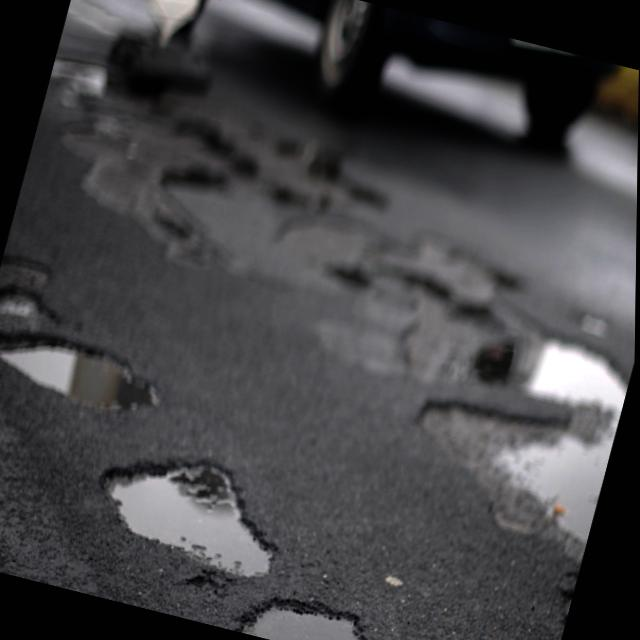

In [7]:
Image("/content/drive/MyDrive/AI1/train/images/pic-3-_jpg.rf.1f39da1d67e7044320a0a602d9819741.jpg")

In [10]:
#List the saved models in 'runs' directory. Note that you will see multiple 'train' subdirectories numbered 1, 2, 3, etc. The exact number depends on the number of epochs.
%ls /content/drive/MyDrive/AI1/results/200_epochs-4/weights

best.pt  last.pt


In [11]:
my_new_model = YOLO('/content/drive/MyDrive/AI1/results/200_epochs-4/weights/best.pt')


In [12]:
new_image = '/content/drive/MyDrive/AI2/test-pic/pic-247-_jpg.rf.5b9be4976067ff481a06a5d7f1916133.jpg'
new_results = my_new_model.predict(new_image, conf=0.2)  #Adjust conf threshold


image 1/1 /content/drive/MyDrive/AI2/test-pic/pic-247-_jpg.rf.5b9be4976067ff481a06a5d7f1916133.jpg: 640x640 5 potholes, 16.6ms
Speed: 2.0ms preprocess, 16.6ms inference, 5.5ms postprocess per image at shape (1, 3, 640, 640)


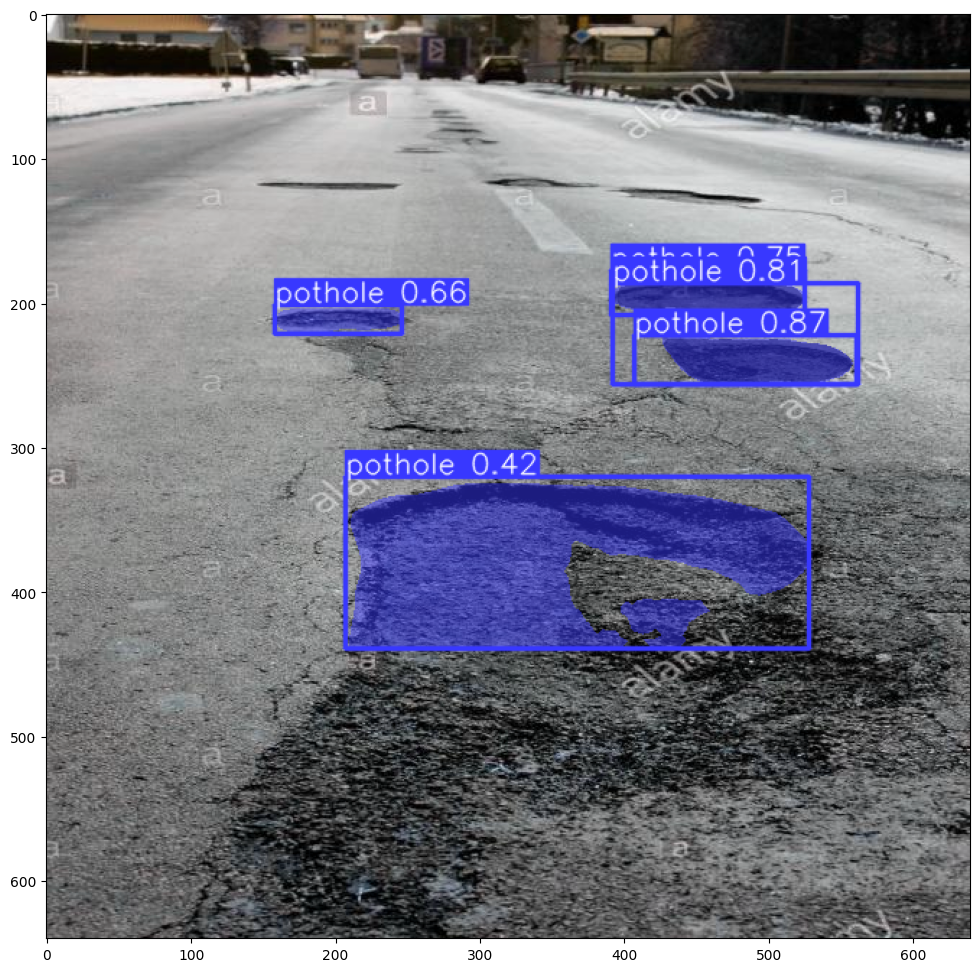

In [13]:
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

In [14]:
new_result = new_results[0]

In [15]:
new_result

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'pothole'}
obb: None
orig_img: array([[[247, 247, 247],
        [252, 252, 252],
        [249, 249, 249],
        ...,
        [ 23,  23,  23],
        [ 12,  12,  12],
        [  3,   3,   3]],

       [[252, 252, 252],
        [255, 255, 255],
        [252, 252, 252],
        ...,
        [ 19,  19,  19],
        [ 13,  13,  13],
        [  9,   9,   9]],

       [[252, 252, 252],
        [254, 254, 254],
        [252, 252, 252],
        ...,
        [ 12,  12,  12],
        [ 11,  11,  11],
        [ 10,  10,  10]],

       ...,

       [[ 97,  95,  95],
        [ 89,  87,  87],
        [ 86,  84,  84],
        ...,
        [ 78,  78,  78],
        [ 71,  71,  71],
        [ 81,  81,  81]],

       [[100,  98,  98],
        [104, 102, 102],
        [112, 110, 110],
        ...,
        [ 95,  95,  95],
  

In [16]:
new_result.masks.xyn

[array([[    0.67188,     0.35156],
        [    0.67031,     0.35313],
        [    0.67031,     0.35469],
        [    0.66875,     0.35625],
        [    0.66875,     0.35781],
        [    0.67031,     0.35938],
        [    0.67031,     0.36094],
        [    0.67969,     0.37031],
        [    0.67969,     0.37187],
        [    0.68125,     0.37344],
        [    0.68125,       0.375],
        [    0.69375,      0.3875],
        [    0.69531,      0.3875],
        [    0.69844,     0.39062],
        [        0.7,     0.39062],
        [    0.70156,     0.39219],
        [    0.70312,     0.39219],
        [    0.70469,     0.39375],
        [    0.70625,     0.39375],
        [    0.70781,     0.39531],
        [    0.70938,     0.39531],
        [    0.71094,     0.39687],
        [    0.71406,     0.39687],
        [    0.71562,     0.39844],
        [    0.75625,     0.39844],
        [    0.75781,     0.39687],
        [    0.78125,     0.39687],
        [    0.78281,     0.

In [17]:
extracted_masks = new_result.masks.data

In [18]:
extracted_masks.shape

torch.Size([5, 640, 640])

In [19]:
masks_array = extracted_masks.cpu().numpy()

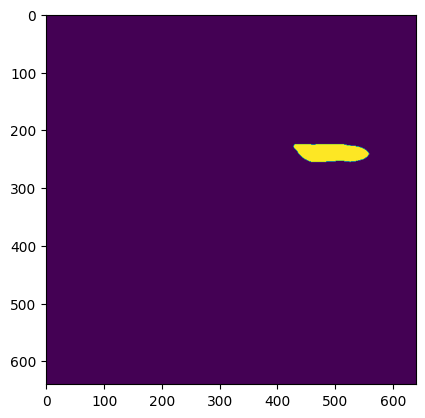

In [22]:
plt.imshow(masks_array[0])

In [21]:
class_names = new_result.names.values()
class_names

dict_values(['pothole'])